In [150]:
import os
import logging

import numpy as np

import torch
from torch import nn
import torch.nn.functional as F

import torchvision

import matplotlib.pyplot as plt

from tracker import Tracker
from itertools import chain

logging.basicConfig(format='%(asctime)s %(levelname)s: %(message)s', datefmt='%Y-%m-%d %H:%M:%S', level=logging.INFO)

device = torch.device('cuda')

logging.info(f'Using device {device}')

2021-12-29 17:01:56 INFO: Using device cuda


In [151]:
batch_size = 256
gamma = 0.001
lr = 1e-4
n_latent = 64
log_int = 50
kl_weight = 0.01

data_dir = os.environ['DATA']

train = torchvision.datasets.MNIST(f'{data_dir}/vision', train=True, download=True)
train = train.data / 255.0
train = train * 2 - 1
train = train.unsqueeze(1)

logging.info(train.shape)

2021-12-29 17:01:56 INFO: torch.Size([60000, 1, 28, 28])


In [152]:
def plot_latent_space(n=30, figsize=15, real=False):
    digit_size = 28
    scale = 1
    figure = np.zeros((digit_size * n, digit_size * n))

    grid_x = np.linspace(-scale, scale, n)
    grid_y = np.linspace(-scale, scale, n)

    for i, yi in enumerate(grid_y):
        for j, xi in enumerate(grid_x):
            with torch.no_grad():
                if real:
                    idx = torch.randint(train.shape[0], (1,))
                    x_decoded = train[idx]
                else:
                    z = torch.randn((1, n_latent, 1, 1), dtype=torch.float, device=device)
                    x_decoded = decoder(z)
            digit = x_decoded[0].reshape(digit_size, digit_size)
            digit = torch.clamp(digit * 0.5 + 0.5, 0.0, 1.0)
            figure[
                i * digit_size : (i + 1) * digit_size,
                j * digit_size : (j + 1) * digit_size,
            ] = digit.cpu()

    plt.figure(figsize=(figsize, figsize))
    start_range = digit_size // 2
    end_range = n * digit_size + start_range
    pixel_range = np.arange(start_range, end_range, digit_size)
    sample_range_x = np.round(grid_x, 1)
    sample_range_y = np.round(grid_y, 1)
    plt.xticks(pixel_range, sample_range_x)
    plt.yticks(pixel_range, sample_range_y)
    plt.xlabel("z[0]")
    plt.ylabel("z[1]")
    plt.imshow(figure, cmap="Greys_r")
    plt.show()

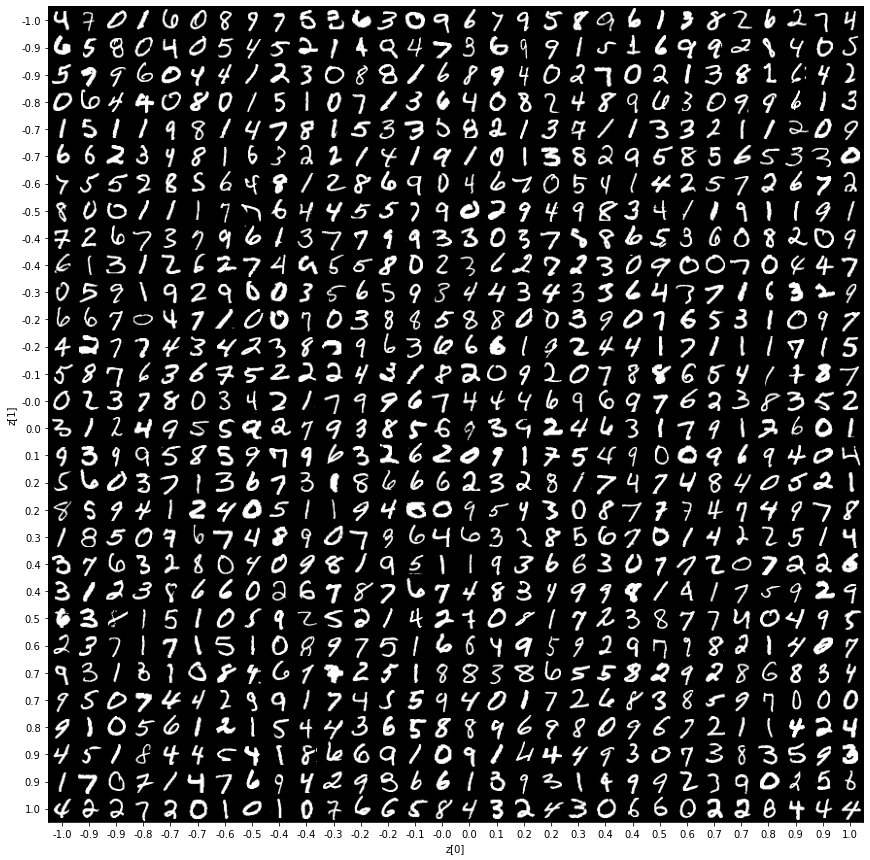

In [153]:
plot_latent_space(real=True)

In [154]:
C = 32
class Encoder(nn.Module):
    def __init__(self):
        super().__init__()

        self.net = nn.Sequential(
            nn.Conv2d(1, C, 4, 2, 1),
            nn.ReLU(True),

            nn.Conv2d(C, 2 * C, 4, 2, 1),
            nn.ReLU(True),

            nn.Conv2d(2 * C, 1024, 7, 7),
            nn.ReLU(True),
        )
        
        self.mu_f = nn.Conv2d(1024, n_latent, 1)
        self.log_var_f = nn.Conv2d(1024, n_latent, 1)

    def forward(self, x):
        x = self.net(x)
        mu = self.mu_f(x)
        log_var = self.log_var_f(x)
        eps = torch.randn_like(log_var)
        z = mu + eps * torch.exp(0.5 * log_var)
        return mu, log_var, z
    
class Decoder(nn.Module):
    def __init__(self):
        super().__init__()

        self.net = nn.Sequential(            
            nn.ConvTranspose2d(n_latent, 1024, 1),
            nn.ReLU(True),
            
            nn.ConvTranspose2d(1024, 2 * C, 7, 7),
            nn.ReLU(True),

            nn.ConvTranspose2d(2 * C, C, 4, 2, 1),
            nn.ReLU(True),

            nn.ConvTranspose2d(C, 1, 4, 2, 1),
            nn.Tanh(),
        )

    def forward(self, x):
        x = self.net(x)
        return x

class Discriminator(nn.Module):
    def __init__(self):
        super().__init__()

        self.net = nn.Sequential(
            nn.Conv2d(1, C, 4, 2, 1),
            nn.ReLU(True),

            nn.Conv2d(C, 2 * C, 4, 2, 1),
            nn.ReLU(True),

            nn.Conv2d(2 * C, 1024, 7, 7),
            nn.ReLU(True),
            
            nn.Conv2d(1024, 1, 1),
            nn.Sigmoid(),
            
            nn.Flatten(),
        )

    def forward(self, x):
        x = self.net(x)
        return x


train = train.to(torch.float).to(device)

encoder = Encoder().to(device)
decoder = Decoder().to(device)
discriminator = Discriminator().to(device)

vae = chain(encoder.parameters(), decoder.parameters())
vae_opt = torch.optim.Adam(vae, lr=lr)
discriminator_opt = torch.optim.Adam(discriminator.parameters(), lr=lr)

logging.info(f'encoder: {sum(p.numel() for p in encoder.parameters())}')
logging.info(f'decoder: {sum(p.numel() for p in decoder.parameters())}')
logging.info(f'discriminator: {sum(p.numel() for p in discriminator.parameters())}')

2021-12-29 17:01:57 INFO: encoder: 3376864
2021-12-29 17:01:57 INFO: decoder: 3311201
2021-12-29 17:01:57 INFO: discriminator: 3246689


2021-12-29 17:01:57 INFO:         KL     RCN    D     
2021-12-29 17:01:57 INFO:     50  0.000  1.483  0.272
2021-12-29 17:01:57 INFO:    100  0.000  2.786  0.148
2021-12-29 17:01:58 INFO:    150  0.000  3.910  0.099
2021-12-29 17:01:58 INFO:    200  0.000  4.778  0.075
2021-12-29 17:01:58 INFO:    250  0.000  5.414  0.060
2021-12-29 17:01:59 INFO:    300  0.000  5.902  0.050
2021-12-29 17:01:59 INFO:    350  0.000  6.294  0.043
2021-12-29 17:02:00 INFO:    400  0.000  6.621  0.037
2021-12-29 17:02:00 INFO:    450  0.000  6.900  0.033
2021-12-29 17:02:00 INFO:    500  0.000  7.144  0.030
2021-12-29 17:02:01 INFO:    550  0.000  7.359  0.027
2021-12-29 17:02:01 INFO:    600  0.000  7.553  0.025
2021-12-29 17:02:02 INFO:    650  0.000  7.728  0.023
2021-12-29 17:02:02 INFO:    700  0.000  7.889  0.021
2021-12-29 17:02:02 INFO:    750  0.000  8.037  0.020
2021-12-29 17:02:03 INFO:    800  0.000  8.173  0.019
2021-12-29 17:02:03 INFO:    850  0.000  8.301  0.018
2021-12-29 17:02:04 INFO:  

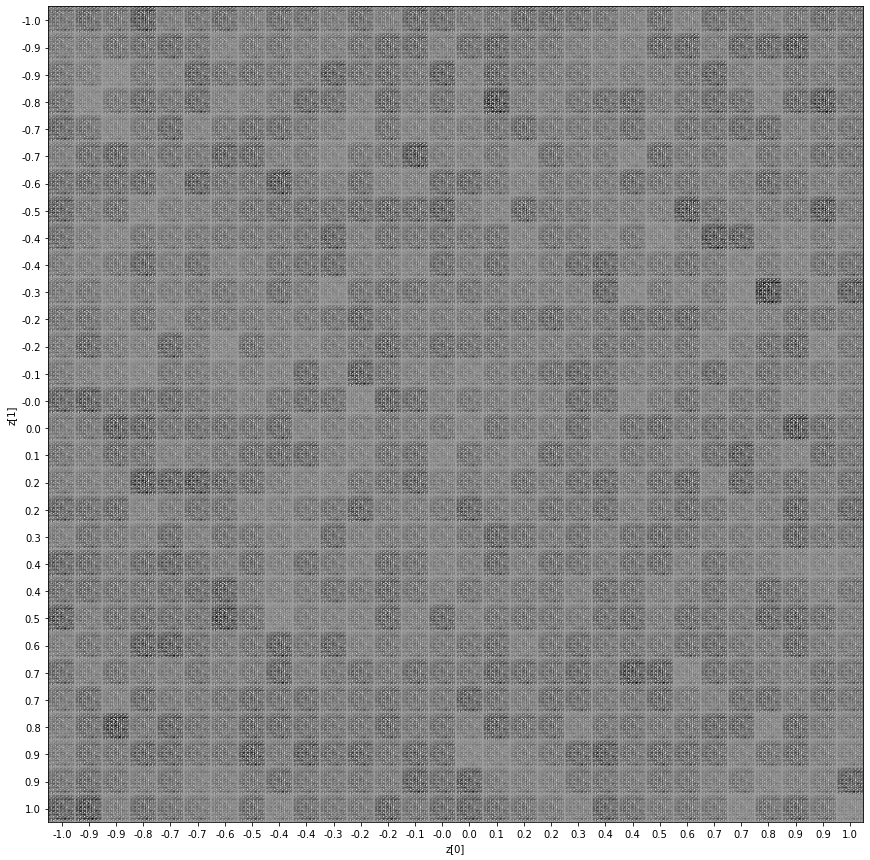

2021-12-29 17:02:06 INFO:   1050  0.000  8.741  0.014
2021-12-29 17:02:06 INFO:   1100  0.000  8.842  0.014
2021-12-29 17:02:06 INFO:   1150  0.000  8.943  0.013
2021-12-29 17:02:07 INFO:   1200  0.000  9.043  0.012
2021-12-29 17:02:07 INFO:   1250  0.000  9.142  0.012
2021-12-29 17:02:08 INFO:   1300  0.000  9.240  0.011
2021-12-29 17:02:08 INFO:   1350  0.000  9.337  0.011
2021-12-29 17:02:08 INFO:   1400  0.000  9.433  0.010
2021-12-29 17:02:09 INFO:   1450  0.000  9.527  0.010
2021-12-29 17:02:09 INFO:   1500  0.000  9.620  0.009
2021-12-29 17:02:09 INFO:   1550  0.000  9.713  0.009
2021-12-29 17:02:10 INFO:   1600  0.000  9.803  0.008
2021-12-29 17:02:10 INFO:   1650  0.000  9.892  0.008
2021-12-29 17:02:11 INFO:   1700  0.000  9.980  0.007
2021-12-29 17:02:11 INFO:   1750  0.000 10.067  0.007
2021-12-29 17:02:12 INFO:   1800  0.000 10.152  0.007
2021-12-29 17:02:12 INFO:   1850  0.000 10.235  0.006
2021-12-29 17:02:12 INFO:   1900  0.000 10.318  0.006
2021-12-29 17:02:13 INFO:   

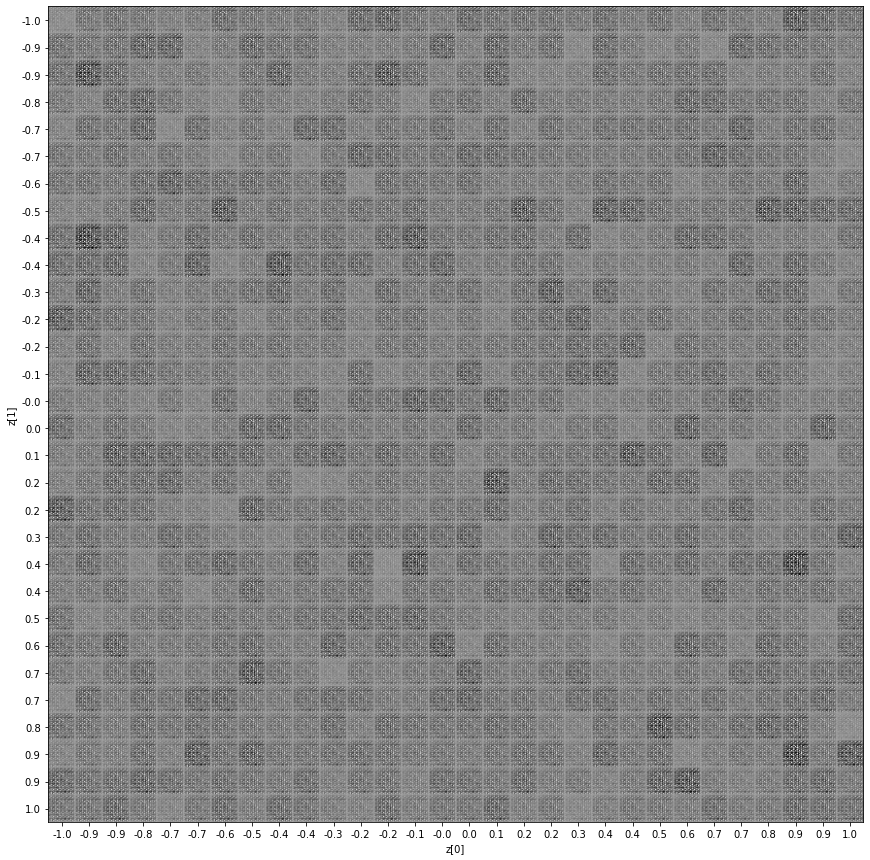

2021-12-29 17:02:14 INFO:   2050  0.000 10.557  0.005
2021-12-29 17:02:15 INFO:   2100  0.000 10.634  0.005
2021-12-29 17:02:15 INFO:   2150  0.000 10.710  0.005
2021-12-29 17:02:15 INFO:   2200  0.000 10.785  0.005
2021-12-29 17:02:16 INFO:   2250  0.000 10.858  0.004
2021-12-29 17:02:16 INFO:   2300  0.000 10.931  0.004
2021-12-29 17:02:17 INFO:   2350  0.000 11.002  0.004
2021-12-29 17:02:17 INFO:   2400  0.000 11.072  0.004
2021-12-29 17:02:17 INFO:   2450  0.000 11.140  0.004
2021-12-29 17:02:18 INFO:   2500  0.000 11.208  0.003
2021-12-29 17:02:18 INFO:   2550  0.000 11.274  0.003
2021-12-29 17:02:19 INFO:   2600  0.000 11.340  0.003
2021-12-29 17:02:19 INFO:   2650  0.000 11.404  0.003
2021-12-29 17:02:19 INFO:   2700  0.000 11.468  0.003
2021-12-29 17:02:20 INFO:   2750  0.000 11.530  0.003
2021-12-29 17:02:20 INFO:   2800  0.000 11.591  0.002
2021-12-29 17:02:20 INFO:   2850  0.000 11.652  0.002
2021-12-29 17:02:21 INFO:   2900  0.000 11.711  0.002
2021-12-29 17:02:21 INFO:   

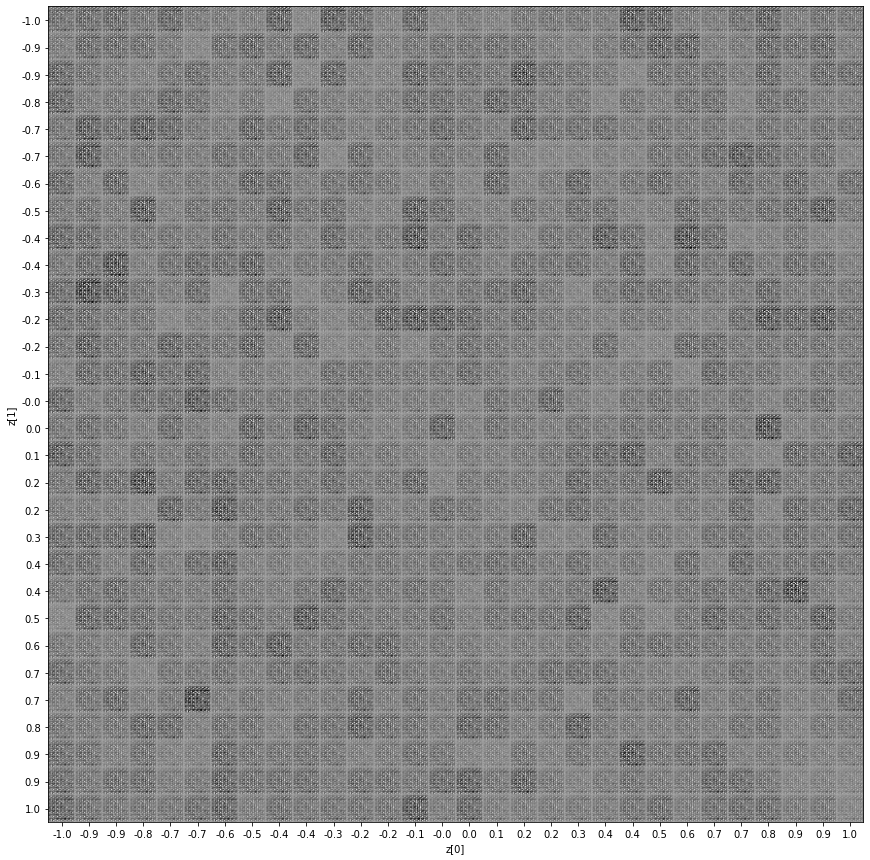

2021-12-29 17:02:23 INFO:   3050  0.000 11.884  0.002
2021-12-29 17:02:23 INFO:   3100  0.000 11.940  0.002
2021-12-29 17:02:23 INFO:   3150  0.000 11.996  0.002
2021-12-29 17:02:24 INFO:   3200  0.000 12.050  0.002
2021-12-29 17:02:24 INFO:   3250  0.000 12.104  0.002
2021-12-29 17:02:25 INFO:   3300  0.000 12.157  0.002
2021-12-29 17:02:25 INFO:   3350  0.000 12.209  0.001
2021-12-29 17:02:25 INFO:   3400  0.000 12.261  0.001
2021-12-29 17:02:26 INFO:   3450  0.000 12.311  0.001
2021-12-29 17:02:26 INFO:   3500  0.000 12.361  0.001
2021-12-29 17:02:27 INFO:   3550  0.000 12.411  0.001
2021-12-29 17:02:27 INFO:   3600  0.000 12.460  0.001
2021-12-29 17:02:27 INFO:   3650  0.000 12.508  0.001
2021-12-29 17:02:28 INFO:   3700  0.000 12.556  0.001
2021-12-29 17:02:28 INFO:   3750  0.000 12.603  0.001
2021-12-29 17:02:29 INFO:   3800  0.000 12.649  0.001
2021-12-29 17:02:29 INFO:   3850  0.000 12.695  0.001
2021-12-29 17:02:29 INFO:   3900  0.000 12.740  0.001
2021-12-29 17:02:30 INFO:   

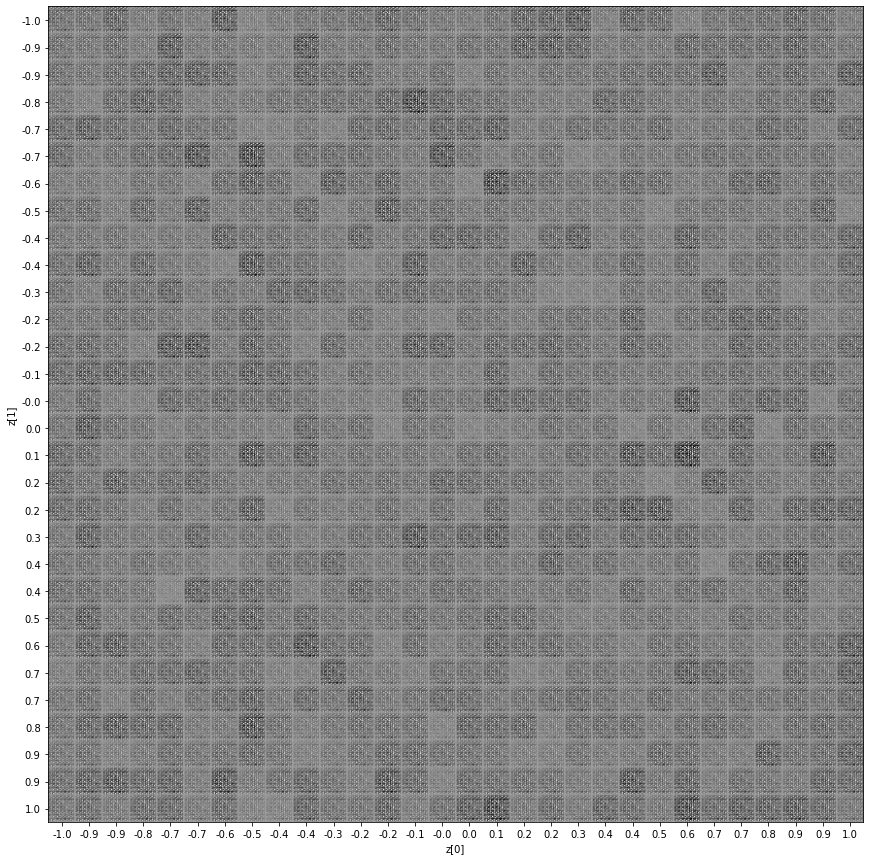

2021-12-29 17:02:31 INFO:   4050  0.000 12.874  0.001
2021-12-29 17:02:32 INFO:   4100  0.000 12.917  0.001
2021-12-29 17:02:32 INFO:   4150  0.000 12.960  0.001
2021-12-29 17:02:32 INFO:   4200  0.000 13.003  0.001
2021-12-29 17:02:33 INFO:   4250  0.000 13.045  0.001
2021-12-29 17:02:33 INFO:   4300  0.000 13.087  0.001
2021-12-29 17:02:34 INFO:   4350  0.000 13.128  0.001
2021-12-29 17:02:34 INFO:   4400  0.000 13.169  0.001
2021-12-29 17:02:34 INFO:   4450  0.000 13.209  0.000
2021-12-29 17:02:35 INFO:   4500  0.000 13.249  0.000
2021-12-29 17:02:35 INFO:   4550  0.000 13.289  0.000
2021-12-29 17:02:35 INFO:   4600  0.000 13.329  0.000
2021-12-29 17:02:36 INFO:   4650  0.000 13.368  0.000
2021-12-29 17:02:36 INFO:   4700  0.000 13.407  0.000
2021-12-29 17:02:37 INFO:   4750  0.000 13.445  0.000
2021-12-29 17:02:37 INFO:   4800  0.000 13.484  0.000
2021-12-29 17:02:37 INFO:   4850  0.000 13.522  0.000
2021-12-29 17:02:38 INFO:   4900  0.000 13.559  0.000
2021-12-29 17:02:38 INFO:   

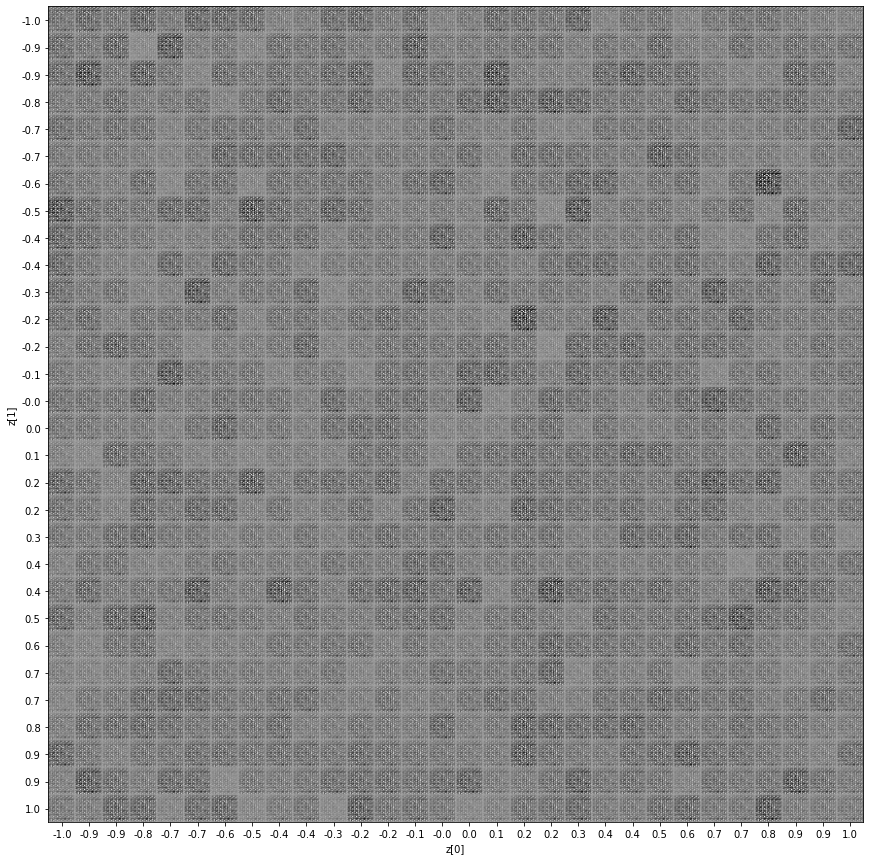

2021-12-29 17:02:40 INFO:   5050  0.000 13.671  0.000
2021-12-29 17:02:40 INFO:   5100  0.000 13.707  0.000
2021-12-29 17:02:40 INFO:   5150  0.000 13.743  0.000
2021-12-29 17:02:41 INFO:   5200  0.000 13.779  0.000
2021-12-29 17:02:41 INFO:   5250  0.000 13.815  0.000
2021-12-29 17:02:42 INFO:   5300  0.000 13.851  0.000
2021-12-29 17:02:42 INFO:   5350  0.000 13.886  0.000
2021-12-29 17:02:42 INFO:   5400  0.000 13.921  0.000
2021-12-29 17:02:43 INFO:   5450  0.000 13.956  0.000
2021-12-29 17:02:43 INFO:   5500  0.000 13.991  0.000
2021-12-29 17:02:43 INFO:   5550  0.000 14.025  0.000
2021-12-29 17:02:44 INFO:   5600  0.000 14.059  0.000
2021-12-29 17:02:44 INFO:   5650  0.000 14.094  0.000
2021-12-29 17:02:45 INFO:   5700  0.000 14.128  0.000
2021-12-29 17:02:45 INFO:   5750  0.000 14.161  0.000
2021-12-29 17:02:45 INFO:   5800  0.000 14.194  0.000
2021-12-29 17:02:46 INFO:   5850  0.000 14.228  0.000
2021-12-29 17:02:46 INFO:   5900  0.000 14.261  0.000
2021-12-29 17:02:47 INFO:   

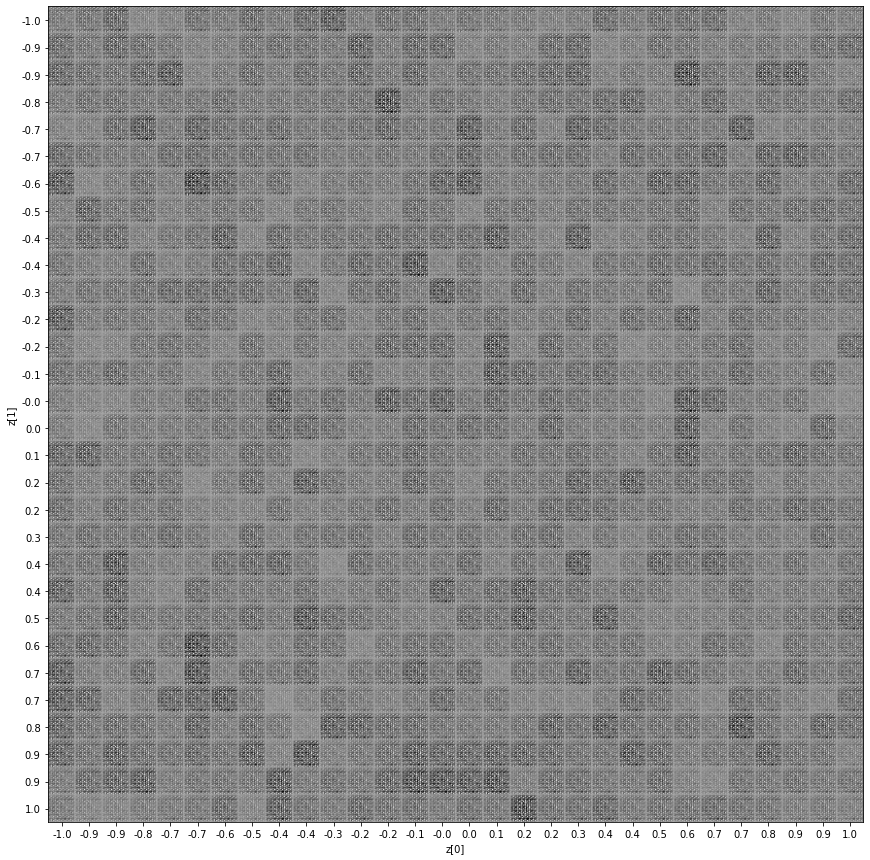

2021-12-29 17:02:48 INFO:   6050  0.000 14.360  0.000
2021-12-29 17:02:48 INFO:   6100  0.000 14.392  0.000
2021-12-29 17:02:49 INFO:   6150  0.000 14.424  0.000
2021-12-29 17:02:49 INFO:   6200  0.000 14.457  0.000
2021-12-29 17:02:50 INFO:   6250  0.000 14.489  0.000
2021-12-29 17:02:50 INFO:   6300  0.000 14.521  0.000
2021-12-29 17:02:50 INFO:   6350  0.000 14.552  0.000
2021-12-29 17:02:51 INFO:   6400  0.000 14.584  0.000
2021-12-29 17:02:51 INFO:   6450  0.000 14.616  0.000
2021-12-29 17:02:51 INFO:   6500  0.000 14.647  0.000
2021-12-29 17:02:52 INFO:   6550  0.000 14.679  0.000
2021-12-29 17:02:52 INFO:   6600  0.000 14.710  0.000
2021-12-29 17:02:53 INFO:   6650  0.000 14.741  0.000
2021-12-29 17:02:53 INFO:   6700  0.000 14.772  0.000
2021-12-29 17:02:53 INFO:   6750  0.000 14.803  0.000
2021-12-29 17:02:54 INFO:   6800  0.000 14.834  0.000
2021-12-29 17:02:54 INFO:   6850  0.000 14.864  0.000
2021-12-29 17:02:55 INFO:   6900  0.000 14.895  0.000
2021-12-29 17:02:55 INFO:   

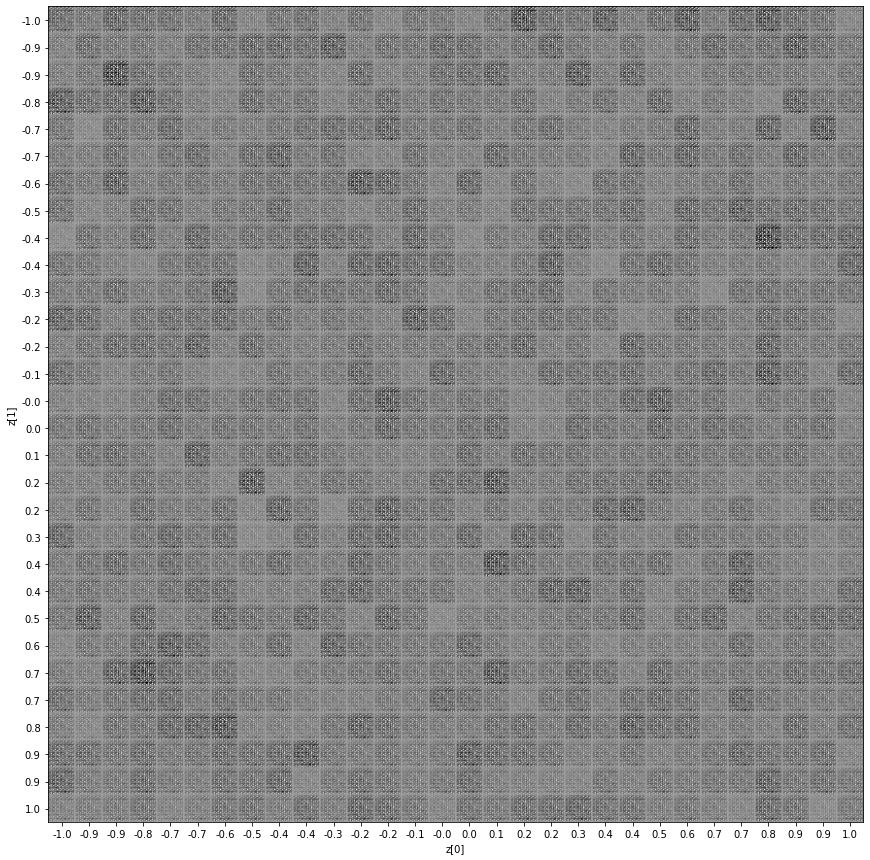

2021-12-29 17:02:56 INFO:   7050  0.000 14.987  0.000
2021-12-29 17:02:57 INFO:   7100  0.000 15.017  0.000
2021-12-29 17:02:57 INFO:   7150  0.000 15.047  0.000
2021-12-29 17:02:58 INFO:   7200  0.000 15.077  0.000
2021-12-29 17:02:58 INFO:   7250  0.000 15.107  0.000
2021-12-29 17:02:58 INFO:   7300  0.000 15.137  0.000
2021-12-29 17:02:59 INFO:   7350  0.000 15.167  0.000
2021-12-29 17:02:59 INFO:   7400  0.000 15.196  0.000
2021-12-29 17:03:00 INFO:   7450  0.000 15.226  0.000
2021-12-29 17:03:00 INFO:   7500  0.000 15.256  0.000
2021-12-29 17:03:00 INFO:   7550  0.000 15.286  0.000
2021-12-29 17:03:01 INFO:   7600  0.000 15.316  0.000
2021-12-29 17:03:01 INFO:   7650  0.000 15.345  0.000
2021-12-29 17:03:02 INFO:   7700  0.000 15.374  0.000
2021-12-29 17:03:02 INFO:   7750  0.000 15.404  0.000
2021-12-29 17:03:02 INFO:   7800  0.000 15.433  0.000
2021-12-29 17:03:03 INFO:   7850  0.000 15.462  0.000
2021-12-29 17:03:03 INFO:   7900  0.000 15.492  0.000
2021-12-29 17:03:04 INFO:   

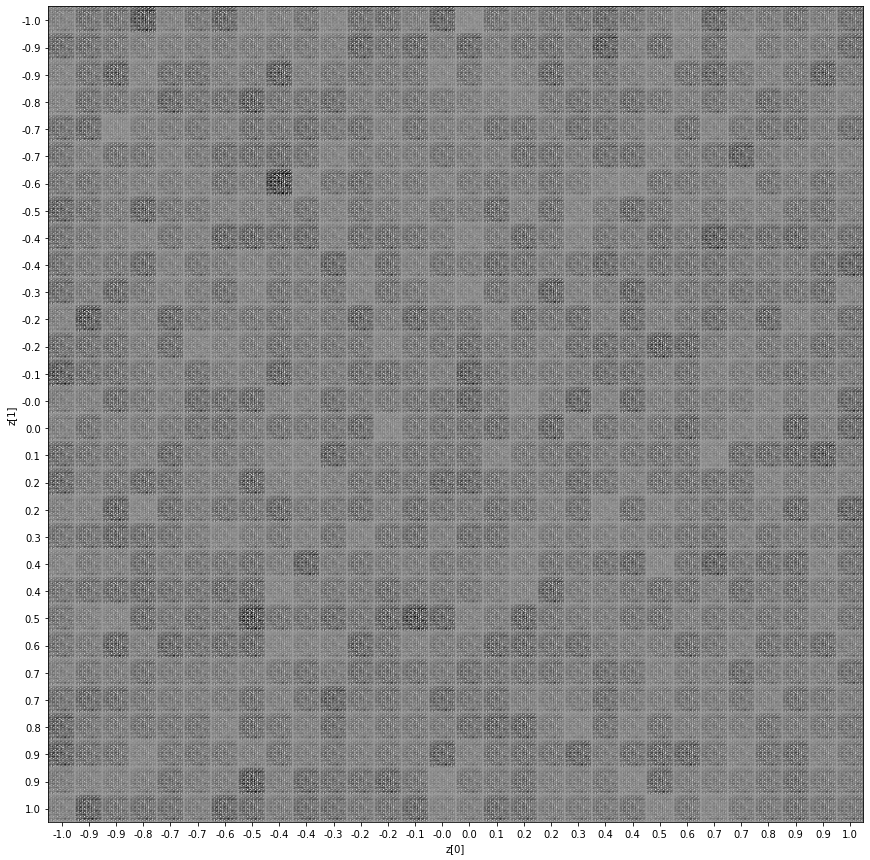

2021-12-29 17:03:05 INFO:   8050  0.000 15.579  0.000
2021-12-29 17:03:05 INFO:   8100  0.000 15.608  0.000
2021-12-29 17:03:06 INFO:   8150  0.000 15.637  0.000
2021-12-29 17:03:06 INFO:   8200  0.000 15.665  0.000
2021-12-29 17:03:07 INFO:   8250  0.000 15.694  0.000
2021-12-29 17:03:07 INFO:   8300  0.000 15.723  0.000
2021-12-29 17:03:07 INFO:   8350  0.000 15.752  0.000
2021-12-29 17:03:08 INFO:   8400  0.000 15.781  0.000
2021-12-29 17:03:08 INFO:   8450  0.000 15.810  0.000
2021-12-29 17:03:09 INFO:   8500  0.000 15.838  0.000
2021-12-29 17:03:09 INFO:   8550  0.000 15.867  0.000
2021-12-29 17:03:09 INFO:   8600  0.000 15.895  0.000
2021-12-29 17:03:10 INFO:   8650  0.000 15.924  0.000
2021-12-29 17:03:10 INFO:   8700  0.000 15.952  0.000
2021-12-29 17:03:10 INFO:   8750  0.000 15.981  0.000
2021-12-29 17:03:11 INFO:   8800  0.000 16.009  0.000
2021-12-29 17:03:11 INFO:   8850  0.000 16.038  0.000
2021-12-29 17:03:12 INFO:   8900  0.000 16.066  0.000
2021-12-29 17:03:12 INFO:   

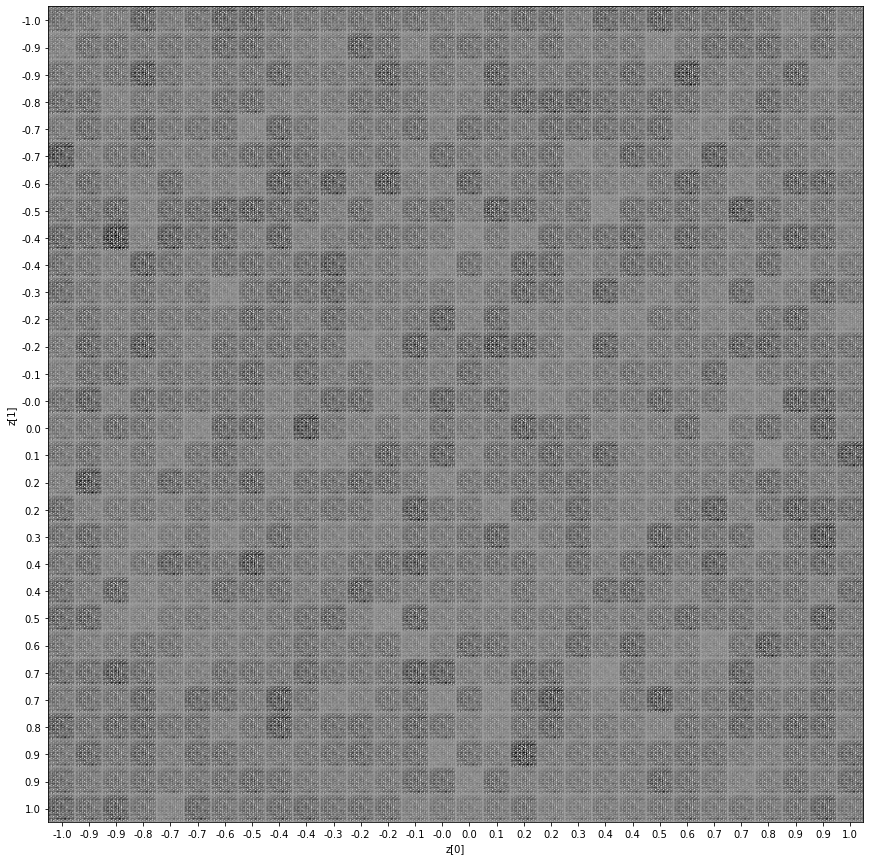

2021-12-29 17:03:14 INFO:   9050  0.000 16.151  0.000
2021-12-29 17:03:14 INFO:   9100  0.000 16.179  0.000
2021-12-29 17:03:14 INFO:   9150  0.000 16.208  0.000
2021-12-29 17:03:15 INFO:   9200  0.000 16.236  0.000
2021-12-29 17:03:15 INFO:   9250  0.000 16.264  0.000
2021-12-29 17:03:16 INFO:   9300  0.000 16.292  0.000
2021-12-29 17:03:16 INFO:   9350  0.000 16.320  0.000
2021-12-29 17:03:17 INFO:   9400  0.000 16.349  0.000
2021-12-29 17:03:17 INFO:   9450  0.000 16.377  0.000
2021-12-29 17:03:17 INFO:   9500  0.000 16.405  0.000
2021-12-29 17:03:18 INFO:   9550  0.000 16.433  0.000


KeyboardInterrupt: 

In [155]:
kl_loss = Tracker(gamma)
rcn_loss = Tracker(gamma)
d_loss = Tracker(gamma)

count = 0

lossf = nn.BCELoss()

logging.info(f'{"":7} {"KL":6} {"RCN":6} {"D":6}')
while True:
    count += 1

    encoder.train()
    decoder.train()
    discriminator.train()

    idx = torch.randint(train.shape[0], (batch_size,))
    x = train[idx]

    vf = torch.full((batch_size, 1,), 1, dtype=torch.float, device=device)
    ff = torch.full((batch_size, 1,), 0, dtype=torch.float, device=device)
    
    mu, log_var, z = encoder(x)
    rcn = decoder(z)
    
    vae_opt.zero_grad()
    
    # kll = -0.5 * (1 + log_var - mu ** 2 - torch.exp(log_var)).mean(0).sum() * kl_weight
    # kll.backward(retain_graph=True)
    
    rcnl = F.binary_cross_entropy(discriminator(rcn), vf)
    # rcnl = F.mse_loss(x, rcn)
    rcnl.backward()
    
    vae_opt.step()
    
    discriminator_opt.zero_grad()
    
    dl = (F.binary_cross_entropy(discriminator(x), vf) 
        + F.binary_cross_entropy(discriminator(rcn.detach()), ff)) * 0.5
    dl.backward()
    
    discriminator_opt.step()
    
    # kl_loss.add(kll.item())
    rcn_loss.add(rcnl.item())
    d_loss.add(dl.item())

    if count % log_int == 0:
        logging.info(f'{count:6} {kl_loss} {rcn_loss} {d_loss}')

    if count % 1000 == 0:
        decoder.eval()
        plot_latent_space()